# ML pipeline

## Splitting

Splitting the data into test and train data
- Rybner: Each dataset was partitioned into a training set and a test set with an 80/20 split, stratified by participant ID; all data points for a given participant ended up in the same partition. We also ensured the test set included an equal number of participants from each diagnostic group 

we want to take expressivelangraw into account. Stratify by this? 

The functions are under src, utils, split.py

In [21]:
# import libraries
import pandas as pd
import numpy as np

In [22]:
# read in data
clean_data = pd.read_csv('../in/clean_features.csv')
print(f"Number of unique participants is: {clean_data['Participant'].nunique()}")
clean_data.head()

Number of unique participants is: 67


,Participant,Visit,Duration,ASD,Gender,Age,ExpressiveLangRaw,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,...,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,ExpressiveLangRaw1
0,0,1,23.74,0.0,1.0,40.13,NaN,40.659519,0.131604,35.850307,...,-0.002900,0.088063,1.390645,1.821262,0.158837,0.131736,0.378333,0.672536,-26.992199,NaN
1,0,1,8.15,0.0,1.0,40.13,NaN,38.676754,0.172724,31.886988,...,-0.006561,0.143007,1.719902,1.856436,0.170667,0.185812,0.348000,0.623690,-25.599806,NaN
2,0,1,2.83,0.0,1.0,40.13,NaN,45.456615,0.051397,43.772179,...,-0.001511,0.067914,4.964539,1.805054,0.066000,0.016248,0.468000,0.635623,-38.131786,NaN
3,0,1,3.96,0.0,1.0,40.13,NaN,43.732323,0.146375,35.226803,...,-0.004340,0.046791,2.025316,1.542416,0.073333,0.043076,0.668000,0.885356,-38.917393,NaN
4,0,1,31.76,0.0,1.0,40.13,NaN,42.977459,0.220249,34.966969,...,-0.001777,0.078688,2.078740,1.677215,0.170000,0.183920,0.498372,1.225437,-29.441130,NaN


In [23]:
from utils.split import custom_train_test_split

X_train, y_train, X_test, y_test = custom_train_test_split(clean_data, random_state=42)

/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/split.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boys_df['quantile'] = pd.qcut(boys_df['ExpressiveLangRaw1'], q=6, labels=False, duplicates='drop')


In [24]:
print("Training set shape:", X_train.shape, y_train.shape)
print("Test set shape:", X_test.shape, y_test.shape)

print(X_test['Participant'].nunique())
print(X_train['Participant'].nunique())


# ExpressiveLangRaw distribution in the test set
print("ExpressiveLangRaw distribution in test set:\n", X_test['ExpressiveLangRaw1'].describe())
print("ExpressiveLangRaw distribution in train set:\n", X_train['ExpressiveLangRaw1'].describe())

# ASD distribution in test set
print("ASD value counts in the test set:\n", y_test.value_counts())

# 12 is 18 % 


Training set shape: (48007, 95) (48007,)
Test set shape: (11370, 95) (11370,)
12
55
ExpressiveLangRaw distribution in test set:
 count    11370.000000
mean        20.215040
std          7.034497
min         10.000000
25%         14.000000
50%         18.000000
75%         27.000000
max         33.000000
Name: ExpressiveLangRaw1, dtype: float64
ExpressiveLangRaw distribution in train set:
 count    42540.000000
mean        19.053902
std          6.021704
min          8.000000
25%         14.000000
50%         18.000000
75%         22.000000
max         33.000000
Name: ExpressiveLangRaw1, dtype: float64
ASD value counts in the test set:
 ASD
0.0    6031
1.0    5339
Name: count, dtype: int64


In [25]:
#X_test.groupby('Participant')['Gender'].value_counts() # all boys! 
#X_train.groupby('Participant')['Gender'].value_counts() # is there an overlap?

# check for overlap: 
participants_test = set(X_test['Participant'].unique())
participants_train = set(X_train['Participant'].unique())

overlap = participants_test.intersection(participants_train)
overlap


set()

## Split based on visits

### Assessing whether this ability to predict varies according to visit (is it easier at later visits) 
Take all the data except the age we test on. 
-	Train on 1:5, test on 6.
-	Train on 1:4, 5, test on 5
-	Train on 1:3, 5:6 test on 4
-	Train on 1:2, 4:6 test on 3
-	Train on 1, 3:6 test on 2
-	Train on 2:6 test on 1. 

#### Testing on the same participants

In [26]:
from utils.split import train_test_split_by_visit_same

splits_same = train_test_split_by_visit_same(clean_data, random_state=666)

# Access splits for visit 1
X_train_same1 = splits_same['visit_1']['X_train']
y_train_same1 = splits_same['visit_1']['y_train']
X_test_same1 = splits_same['visit_1']['X_test']
y_test_same1 = splits_same['visit_1']['y_test']

print(f"X_train_same1 shape: {X_train_same1.shape}, y_train_same1 shape: {y_train_same1.shape}")
print(f"X_test_same1 shape: {X_test_same1.shape}, y_test_visit1 shape: {y_test_same1.shape}")


X_train_same1 shape: (50398, 90), y_train_same1 shape: (50398,)
X_test_same1 shape: (8979, 90), y_test_visit1 shape: (8979,)


In [27]:
y_test_same1.value_counts()

ASD
1.0    4617
0.0    4362
Name: count, dtype: int64

#### Testing on new participants

In [28]:
from utils.split import train_test_split_by_visit_new

columns_to_remove = ['Gender','Age', 'ExpressiveLangRaw', 'ExpressiveLangRaw1', 'Participant']


# Remove the specified columns from X_train and X_test
X_train = X_train.drop(columns=columns_to_remove, errors='ignore')
X_test = X_test.drop(columns=columns_to_remove, errors='ignore')

# use the custom function
visits = sorted(clean_data['Visit'].unique())  
splits_new = train_test_split_by_visit_new(X_train, y_train, X_test, y_test, visits)

# Accessing the split for Visit 1 
X_train_new1 = splits_new['visit_1']['X_train']
y_train_new1 = splits_new['visit_1']['y_train']
X_test_new1 = splits_new['visit_1']['X_test']
y_test_new1 = splits_new['visit_1']['y_test']

print(f"X_train_new1 shape: {X_train_new1.shape}, y_train_new1 shape: {y_train_new1.shape}")
print(f"X_test_new1 shape: {X_test_new1.shape}, y_test_new1 shape: {y_test_new1.shape}")


X_train_new1 shape: (40949, 90), y_train_new1 shape: (40949,)
X_test_new1 shape: (1921, 90), y_test_new1 shape: (1921,)


In [29]:
y_test_new1.value_counts()

ASD
0.0    1026
1.0     895
Name: count, dtype: int64

In [30]:


feature_names = X_train.columns.tolist()


## Scale the whole dataset

In [31]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the X_train_sample data
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test) # add to test

## Bayesian optimization 

Optuna: https://medium.com/@taeefnajib/hyperparameter-tuning-using-optuna-c46d7b29a3e

#### Try this analysis: 
https://www.kaggle.com/code/para24/xgboost-stepwise-tuning-using-optuna#7.-Stepwise-Hyperparameter-Tuning

### XGBoost

#### Default params

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 48007 samples
 Test Size: 11370 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0.014 seconds
----

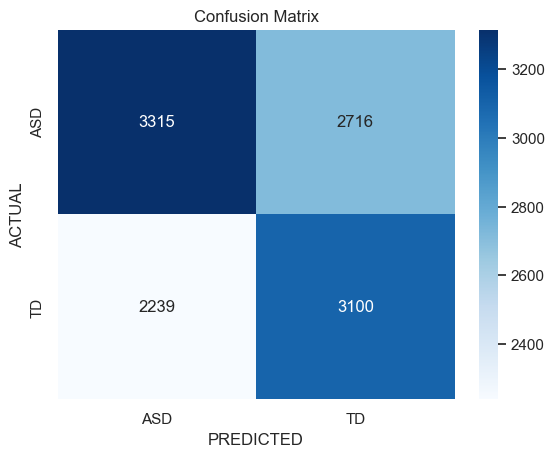


=======================================> PLOTS <=========================================


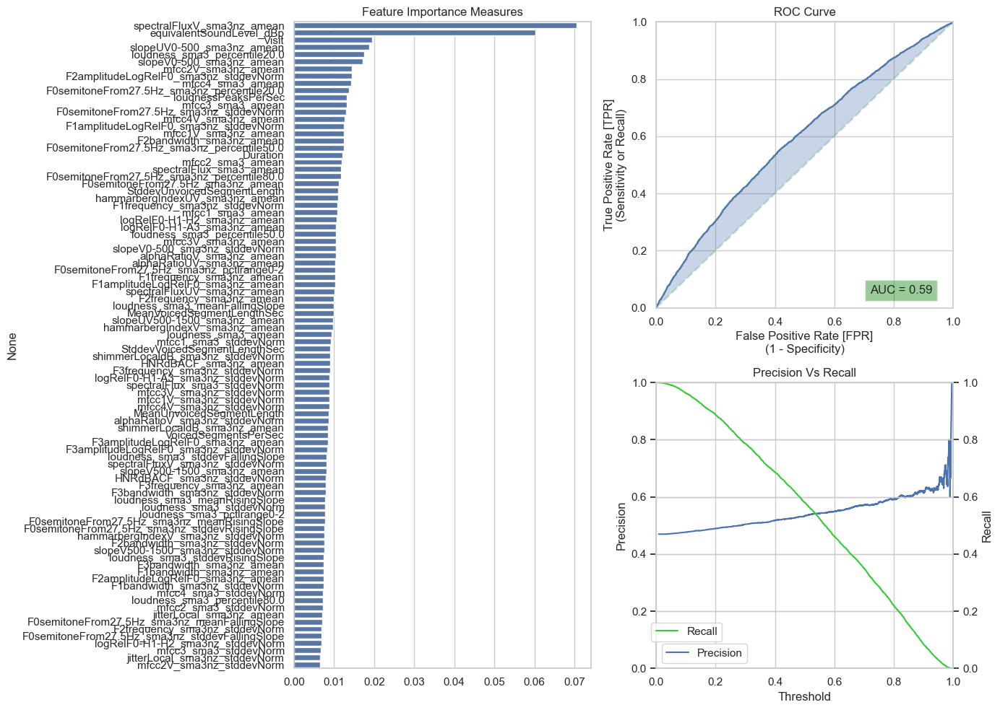

In [32]:
from utils.optimization import report, compare_models

# XGBoost with default parameters 
from xgboost import XGBClassifier
from sklearn.utils import class_weight
from sklearn import metrics



primary_eval_metric = metrics.f1_score
confusion_lbs = ['ASD', 'TD']

## Compute `class_weights` using sklearn
cls_weight = (y_train.shape[0] - np.sum(y_train)) / np.sum(y_train)


# train the default classifier
xgb_clf_default = XGBClassifier(scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_default.fit(X_train, y_train);

xgb_clf_default, xgb_report_default = report(xgb_clf_default, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

### Tune hyperparameters

In [33]:
from utils.optimization import stepwise_optimization

# peform bayesian optimization 

params1 = stepwise_optimization(X_train, y_train) # 10 trials is default 
params1

=========================== Optimizing Group - 1 ============================


/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  params['min_child_weight'] = trial.suggest_loguniform('min_child_weight',
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  params['min_child_weight'] = trial.suggest_loguniform('min_child_weight',
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) in

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 1 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.suggest_uniform('colsample_bytree', 0, 1)
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.suggest_uniform('colsample_bytree', 0, 1)
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.sugg

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 2 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/e

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 3 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

{'learning_rate': 0.0368771353353596,
 'max_depth': 8,
 'min_child_weight': 1.6750810285737576e-10,
 'subsample': 0.2610705290681919,
 'colsample_bytree': 0.03920581182118543}

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.03920581182118543, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0368771353353596,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 48007 samples
 Test Size: 11370 samples
---------------------------------------------


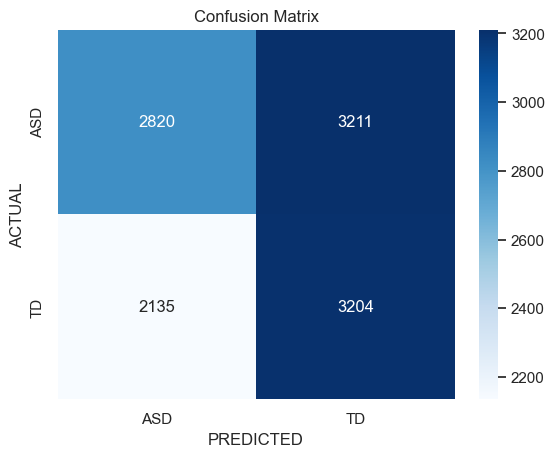


=======================================> PLOTS <=========================================


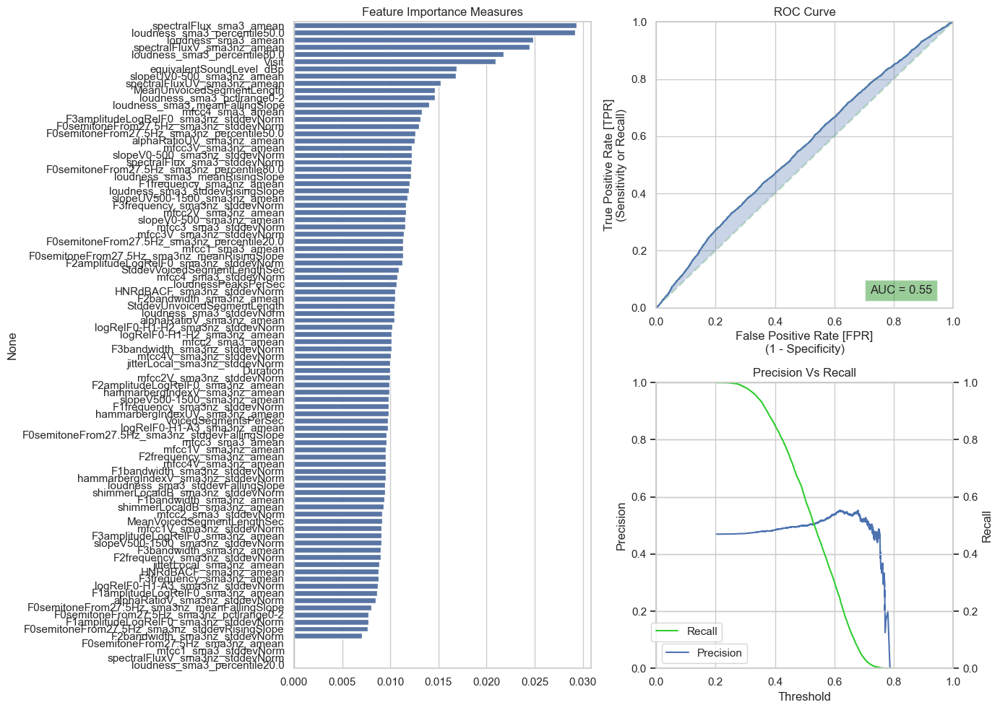

In [34]:

xgb_clf_tuned_1 = XGBClassifier(**params1, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_tuned_1.fit(X_train, y_train);

xgb_clf_tuned_1, xgb_report_tuned_1 = report(xgb_clf_tuned_1, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

In [35]:
params2 = stepwise_optimization(X_train, y_train, trials=50)
params2

=========================== Optimizing Group - 1 ============================


/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  params['min_child_weight'] = trial.suggest_loguniform('min_child_weight',
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  params['min_child_weight'] = trial.suggest_loguniform('min_child_weight',
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:370: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) in

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 1 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.suggest_uniform('colsample_bytree', 0, 1)
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.suggest_uniform('colsample_bytree', 0, 1)
/Users/idaelmosebroecker/Desktop/bachelor/coding/src/utils/optimization.py:375: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  params['colsample_bytree'] = trial.sugg

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 2 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/training.py:38: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/e

STUDY NAME:  xgboost
------------------------------------------------
EVALUATION METRIC:  f1_score
------------------------------------------------
BEST CV SCORE 1.0
------------------------------------------------
OPTIMAL GROUP - 3 PARAMS:  {'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}
------------------------------------------------
BEST TRIAL FrozenTrial(number=15, state=1, values=[1.0], datetime_start=datetime.datetime(2024, 10, 4, 14, 43, 47, 582997), datetime_complete=datetime.datetime(2024, 10, 4, 14, 43, 54, 246121), params={'max_depth': 8, 'min_child_weight': 1.6750810285737576e-10}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.8935601999999999, 1: 0.9274692, 2: 0.9714596, 3: 0.9863111999999999, 4: 0.9986772, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0}, distributions={'max_depth': IntDistribution(high=10, log=False, low=2, step=1), 'min_child_weight': FloatDistribution(high=10000000000.0, log=True, low=1e-10, step=None)}, trial_id=16, value=None)
------

{'learning_rate': 0.017418785735494602,
 'max_depth': 8,
 'min_child_weight': 1.6750810285737576e-10,
 'subsample': 0.30518284789532174,
 'colsample_bytree': 0.852502339191008}

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.852502339191008, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.017418785735494602,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 48007 samples
 Test Size: 11370 samples
---------------------------------------------


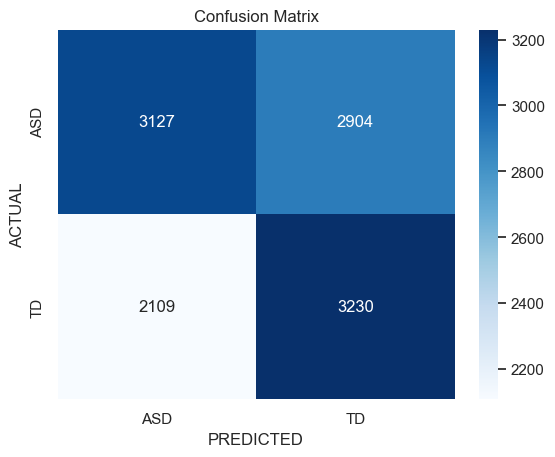


=======================================> PLOTS <=========================================


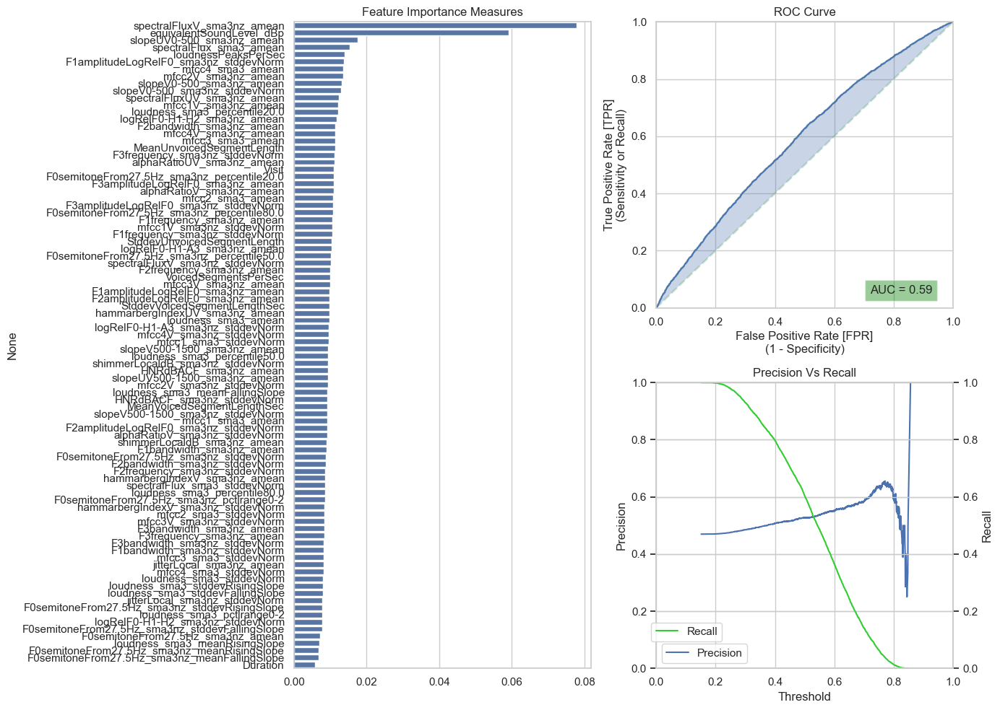

In [36]:
xgb_clf_tuned_2 = XGBClassifier(**params2, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1)
xgb_clf_tuned_2.fit(X_train, y_train);

xgb_clf_tuned_2, xgb_report_tuned_2 = report(xgb_clf_tuned_2, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

### SVM

#### Default params

In [40]:
from utils.optimization import execute_optimization_SVM
from sklearn.svm import SVC
from utils.optimization import report
from sklearn import metrics

#train with default
default_SVM = SVC(probability=True,
              class_weight='balanced', random_state=42)

# Fit the final model
default_SVM.fit(X_train, y_train);

primary_eval_metric = metrics.f1_score
confusion_lbs = ['ASD', 'TD']
default_SVM, svm_report = report(default_SVM, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)




#### Tune hyperparameters

In [24]:
from utils.optimization import execute_optimization_SVM
from sklearn.svm import SVC

# perform optimization
params_SVM1 = execute_optimization_SVM("SVM", trials=10, X_train=X_train, y_train=y_train)
params_SVM1

STUDY NAME:  SVM
------------------------------------------------
BEST CV SCORE 0.9386293210994406
------------------------------------------------
BEST TRIAL FrozenTrial(number=352, state=1, values=[0.9386293210994406], datetime_start=datetime.datetime(2024, 10, 21, 13, 11, 7, 818103), datetime_complete=datetime.datetime(2024, 10, 21, 13, 11, 59, 970238), params={'C': 0.38407467310058563, 'gamma': 'scale', 'kernel': 'linear'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=10000.0, log=True, low=0.0001, step=None), 'gamma': CategoricalDistribution(choices=('scale', 'auto')), 'kernel': CategoricalDistribution(choices=('linear', 'poly', 'rbf'))}, trial_id=4259, value=None)
------------------------------------------------


{'C': 0.38407467310058563, 'gamma': 'scale', 'kernel': 'linear'}

SVC(C=0.38407467310058563, class_weight='balanced', kernel='linear',
    probability=True, random_state=42)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 50232 samples
 Test Size: 9145 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 11.922 seconds
---------------------------------------------
Train Accuracy:  0.6517160375856028
 Test Accuracy:  0.6239475123018042
---------------------------------------------
Train F1 Score:  0.6462154455926068
 Test F1 Score:  0.6185246810870771

---------------------------------------------
 Area Under ROC (test):  0.6667565426128419
---------------------------------------------
Model Memory Size: 28630.74 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

         ASD       0.58      0.69      0.63      4221
          TD       0.68      0.57      0.62  

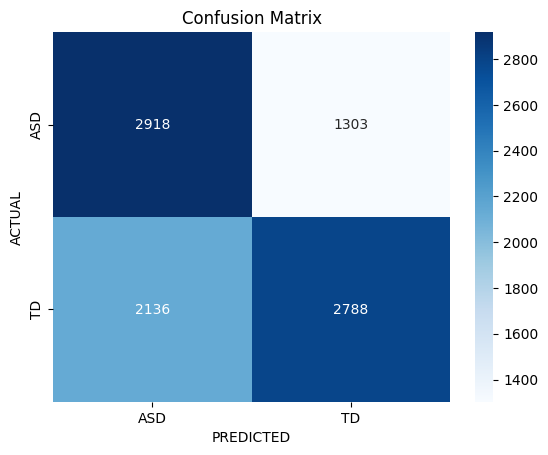


=======================================> PLOTS <=========================================


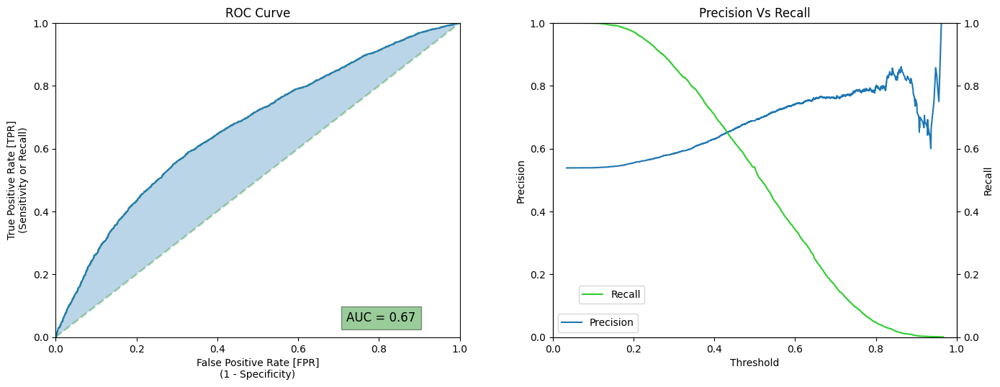

In [25]:
# fit it
svm_clf_tuned_1 = SVC(**params_SVM1, probability=True,
              class_weight='balanced', random_state=42)

svm_clf_tuned_1.fit(X_train, y_train);

svm_clf_tuned_1, svm_report_tuned_1 = report(svm_clf_tuned_1, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

STUDY NAME:  SVM
------------------------------------------------
BEST CV SCORE 0.9386293210994406
------------------------------------------------
BEST TRIAL FrozenTrial(number=352, state=1, values=[0.9386293210994406], datetime_start=datetime.datetime(2024, 10, 21, 13, 11, 7, 818103), datetime_complete=datetime.datetime(2024, 10, 21, 13, 11, 59, 970238), params={'C': 0.38407467310058563, 'gamma': 'scale', 'kernel': 'linear'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=10000.0, log=True, low=0.0001, step=None), 'gamma': CategoricalDistribution(choices=('scale', 'auto')), 'kernel': CategoricalDistribution(choices=('linear', 'poly', 'rbf'))}, trial_id=4259, value=None)
------------------------------------------------
SVC(C=0.38407467310058563, class_weight='balanced', kernel='linear',
    probability=True, random_state=42)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 50232 s

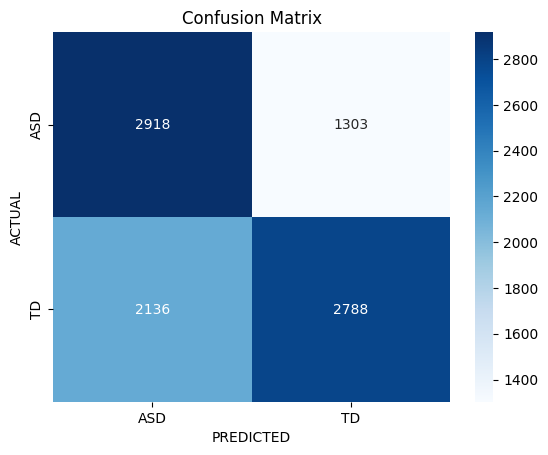


=======================================> PLOTS <=========================================


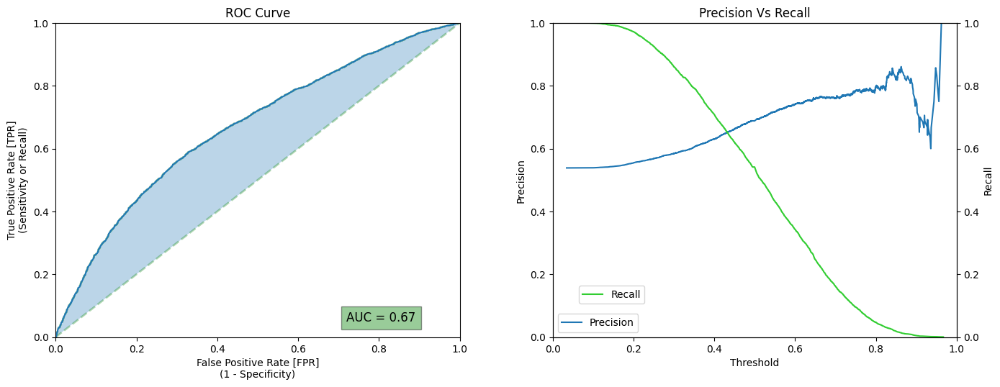

In [26]:
params_SVM2 = execute_optimization_SVM("SVM", trials=50, X_train=X_train, y_train=y_train)
params_SVM2

svm_clf_tuned_2 = SVC(**params_SVM2, probability=True,
              class_weight='balanced', random_state=42)

# Fit the final model
svm_clf_tuned_2.fit(X_train, y_train);

svm_clf_tuned_2, svm_report_tuned_2 = report(svm_clf_tuned_2, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=False,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

### Model comparison

In [30]:
# Model comparison
report_list = [xgb_report_default, xgb_report_tuned_1, xgb_report_tuned_2, svm_report, svm_report_tuned_1, svm_report_tuned_2]
clf_labels = ['XGBoost with default params',
              'XGBoost after 10 trials',
              'XGBoost after 50 trials', 
              'SVM with default parameters',
              'SVM after 10 trials',
              'SVM after 50 trials']

In [31]:
compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

compare_table

,Train f1_score,Test f1_score,Overfitting,ROC Area,Precision,Recall,F1-score,Support
XGBoost with default params,0.885,0.591,True,0.62333,0.636832,0.55199,0.591384,4924.0
XGBoost after 10 trials,0.821,0.593,True,0.629532,0.64033,0.551381,0.592536,4924.0
XGBoost after 50 trials,0.898,0.592,True,0.628883,0.640057,0.550366,0.591832,4924.0
SVM with default parameters,0.679,0.616,True,0.65353,0.652075,0.583875,0.616093,4924.0
SVM after 10 trials,0.646,0.619,True,0.666757,0.681496,0.566206,0.618525,4924.0
SVM after 50 trials,0.646,0.619,True,0.666757,0.681496,0.566206,0.618525,4924.0


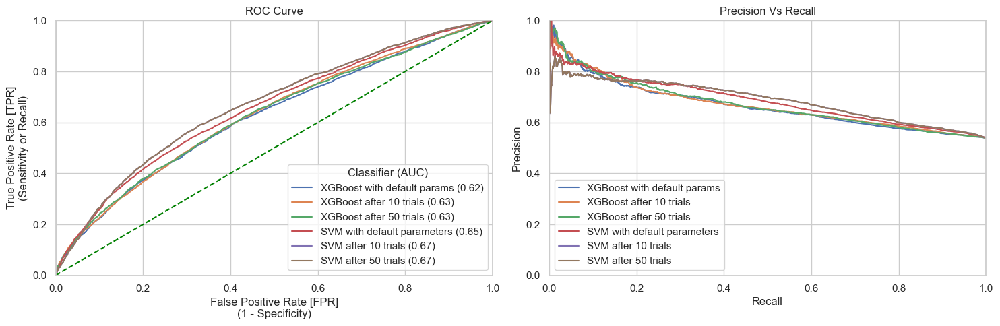

In [32]:
compare_plot

In [35]:
import os

#save it
compare_table.to_csv(os.path.join('..', 'out', 'compare_table_all_new.csv'), index=True, mode='w', header=True)  

In [33]:
# try adding the hyperprameters to the table
hyperparameters = {
    'XGBoost with default params': "default XGB",
    'XGBoost after 10 trials': params1,
    'XGBoost after 50 trials': params2,
    'SVM with default parameters': "default SVM",
    'SVM after 10 trials': params_SVM1,
    'SVM after 100 trials': params_SVM2
}

compare_table['Hyperparameters'] = compare_table.index.map(hyperparameters)


In [34]:
compare_table

,Train f1_score,Test f1_score,Overfitting,ROC Area,Precision,Recall,F1-score,Support,Hyperparameters
XGBoost with default params,0.885,0.591,True,0.62333,0.636832,0.55199,0.591384,4924.0,default XGB
XGBoost after 10 trials,0.821,0.593,True,0.629532,0.64033,0.551381,0.592536,4924.0,"{'learning_rate': 0.085336233770805, 'max_dept..."
XGBoost after 50 trials,0.898,0.592,True,0.628883,0.640057,0.550366,0.591832,4924.0,"{'learning_rate': 0.09266307881793942, 'max_de..."
SVM with default parameters,0.679,0.616,True,0.65353,0.652075,0.583875,0.616093,4924.0,default SVM
SVM after 10 trials,0.646,0.619,True,0.666757,0.681496,0.566206,0.618525,4924.0,"{'C': 0.38407467310058563, 'gamma': 'scale', '..."
SVM after 50 trials,0.646,0.619,True,0.666757,0.681496,0.566206,0.618525,4924.0,NaN


# Fit the splittet datasets

#### Try with one function

In [37]:
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import KFold, cross_val_predict, StratifiedKFold
from sklearn.metrics import f1_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
import joblib
import os
from xgboost import XGBClassifier



def perform_5_fold_cv(X, y, model_type, **model_params):
    """
    Perform 5-fold cross-validation and return the average F1 score.
    """
    kf = StratifiedKFold(n_splits=5,shuffle=True,random_state=1)  # Define KFold
    
    if model_type == 'svm':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), # scale within the CV-folds 
            ('svm', SVC(**model_params, class_weight='balanced'))
        ])
    elif model_type == 'xgboost':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), # scale within the CV-folds 
            ('xgboost', XGBClassifier(**model_params, scale_pos_weight=cls_weight,
                                random_state=0, n_jobs=-1))
        ])
    else:
        raise ValueError("Model type must be 'svm' or 'xgboost'")
    
    
    # Perform cross-validation and get predictions
    y_pred_cv = cross_val_predict(pipeline, X, y, cv=kf, n_jobs=None)
    
    # Calculate and return F1 score
    return f1_score(y, y_pred_cv, average='weighted')



def fit_and_evaluate_model(X_train, y_train, X_test, y_test, model_type, dataset_type, visit_num, **model_params):
    """
    Fit the specified model on the training data and evaluate it on the test data.
    
    Returns:
        dict: Dictionary containing F1 scores for training (CV) and testing.
    """
    # Perform 5-fold CV to get F1 score on training data
    f1_train = perform_5_fold_cv(X_train, y_train, model_type, **model_params)
    
    # Create and fit the model on the whole training data
    if model_type == 'svm':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), 
            ('svm', SVC(**model_params, class_weight='balanced'))
        ])
    elif model_type == 'xgboost':
        pipeline = Pipeline([
            ('scaler', MinMaxScaler()), # scale within the CV-folds 
            ('xgboost', XGBClassifier(**model_params, scale_pos_weight=cls_weight,
                                random_state=42, n_jobs=-1))
        ])
    
    pipeline.fit(X_train, y_train)
    
    # Evaluate the model on test data and calculate F1 score
    y_pred_test = pipeline.predict(X_test)
    f1_test = f1_score(y_test, y_pred_test, average='weighted')

    print(f"F1 score test: {f1_test}")  # print the performance on test
    print(f"F1 score train: {f1_train}")  # print the performance train

    # Save the trained model
    model_name = f'model_{dataset_type.lower()}_participants_{visit_num}.pkl'
    joblib.dump(pipeline, os.path.join('..','models', model_name))
    
    return {
        'F1_CV_Train': f1_train,
        'F1_Test': f1_test
    }


def train_and_evaluate(splits_same, splits_new, model_type, **model_params):
    """
    Train and evaluate specified models on 12 datasets (6 from each visit on same participants, 6 on new participants).
    
    Parameters:
        model_type: Type of model to use ('svm' or 'xgboost')
        model_params: Additional parameters for the model
    """
    f1_results = []  # Store results for all datasets
    
    # Prepare datasets for same participants
    for i in range(1, 7):
        print(f"Training and evaluating on same participants from visit {i}")
        X_train_same = splits_same[f'visit_{i}']['X_train']
        y_train_same = splits_same[f'visit_{i}']['y_train']
        X_test_same = splits_same[f'visit_{i}']['X_test']
        y_test_same = splits_same[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train_same, y_train_same, X_test_same, y_test_same, model_type, "Same", i, **model_params)
        metrics['Dataset'] = f'Same_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "Same"
        f1_results.append(metrics)
    
    # Prepare datasets for new participants
    for i in range(1, 7):
        print(f"Training and evaluating on new participants from visit {i}")
        X_train_new = splits_new[f'visit_{i}']['X_train']
        y_train_new = splits_new[f'visit_{i}']['y_train']
        X_test_new = splits_new[f'visit_{i}']['X_test']
        y_test_new = splits_new[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train_new, y_train_new, X_test_new, y_test_new, model_type, "New", i, **model_params)
        metrics['Dataset'] = f'New_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "New"
        f1_results.append(metrics)
    
    f1_df = pd.DataFrame(f1_results)  # convert to df
    f1_df.to_csv(os.path.join('..', 'out', f'f1_results_new_{model_type.upper()}.csv'), index=False, mode='w', header=True)    

    return f1_df


In [38]:

# For XGBoost
f1_results_xgb = train_and_evaluate(splits_same, splits_new, 'xgboost', **params2)


Training and evaluating on same participants from visit 1
F1 score test: 0.6151450469235612
F1 score train: 0.6935756836094896
Training and evaluating on same participants from visit 2
F1 score test: 0.6247556036976715
F1 score train: 0.6820698993103235
Training and evaluating on same participants from visit 3
F1 score test: 0.6259157109390797
F1 score train: 0.6892480222246155
Training and evaluating on same participants from visit 4
F1 score test: 0.6715584996850038
F1 score train: 0.6883274465661914
Training and evaluating on same participants from visit 5
F1 score test: 0.6696226957831941
F1 score train: 0.6876380754060819
Training and evaluating on same participants from visit 6
F1 score test: 0.6541625779398103
F1 score train: 0.6844516412981089
Training and evaluating on new participants from visit 1
F1 score test: 0.4816916806192105
F1 score train: 0.7113734613093231
Training and evaluating on new participants from visit 2
F1 score test: 0.46443068223890144
F1 score train: 0.69

In [19]:
f1_results_xgb

,F1_CV_Train,F1_Test,Dataset,Visit,Type
0,0.696325,0.616075,Same_Participants_1,1,Same
1,0.687904,0.638462,Same_Participants_2,2,Same
2,0.693236,0.630176,Same_Participants_3,3,Same
3,0.692629,0.665807,Same_Participants_4,4,Same
4,0.692002,0.667474,Same_Participants_5,5,Same
5,0.692200,0.643068,Same_Participants_6,6,Same
6,0.691708,0.605097,New_Participants_1,1,New
7,0.678017,0.613401,New_Participants_2,2,New
8,0.689551,0.658884,New_Participants_3,3,New
9,0.687755,0.729435,New_Participants_4,4,New


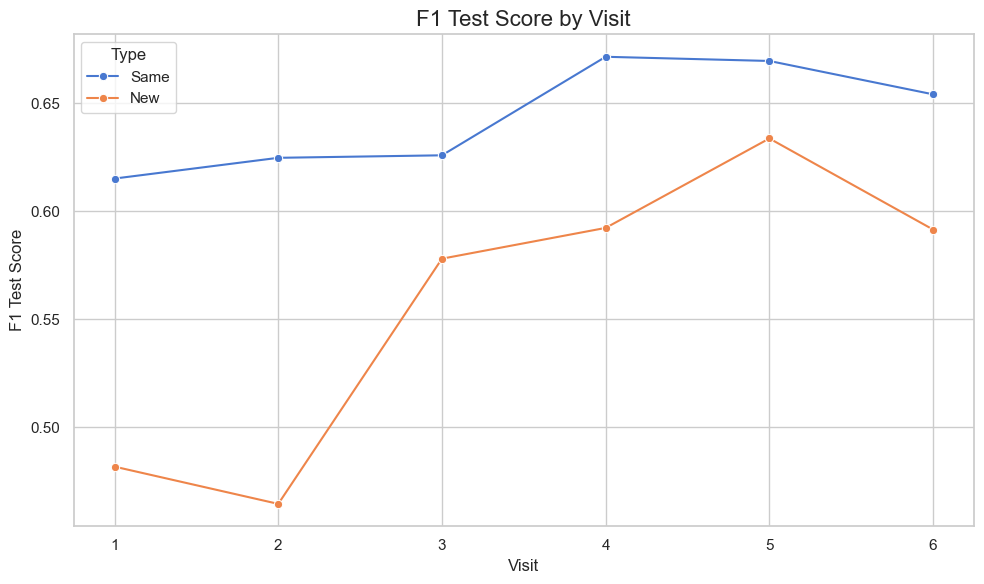

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

#make a simple plot for illustration

sns.set_theme(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.lineplot(data=f1_results_xgb, x='Visit', y='F1_Test', hue='Type', marker='o', dashes=False, palette='muted')

plt.title('F1 Test Score by Visit', fontsize=16)
plt.xlabel('Visit', fontsize=12)
plt.ylabel('F1 Test Score', fontsize=12)

plt.legend(title='Type')

plt.tight_layout()  
plt.show()

In [28]:
#params_svm = {"C": 171.04012116657634, "kernel": 'rbf', "gamma":'scale'}
f1_results_svm = train_and_evaluate(splits_same, splits_new, 'svm', **params_SVM1)


Training and evaluating on same participants from visit 1
F1 score test: 0.6202049186367464
F1 score train: 0.6534904107708825
Training and evaluating on same participants from visit 2
F1 score test: 0.6199150447674076
F1 score train: 0.6563961025135802
Training and evaluating on same participants from visit 3
F1 score test: 0.621614986006209
F1 score train: 0.6536114649703817
Training and evaluating on same participants from visit 4
F1 score test: 0.6635866753607922
F1 score train: 0.6475214697514197
Training and evaluating on same participants from visit 5
F1 score test: 0.6638821762993983
F1 score train: 0.6459188606498295
Training and evaluating on same participants from visit 6
F1 score test: 0.6361714867199466
F1 score train: 0.6498730437765416
Training and evaluating on new participants from visit 1
F1 score test: 0.5925652708744812
F1 score train: 0.6551943437084528
Training and evaluating on new participants from visit 2
F1 score test: 0.5835751326140768
F1 score train: 0.6622

In [29]:
f1_results_svm

,F1_CV_Train,F1_Test,Dataset,Visit,Type
0,0.653490,0.620205,Same_Participants_1,1,Same
1,0.656396,0.619915,Same_Participants_2,2,Same
2,0.653611,0.621615,Same_Participants_3,3,Same
3,0.647521,0.663587,Same_Participants_4,4,Same
4,0.645919,0.663882,Same_Participants_5,5,Same
5,0.649873,0.636171,Same_Participants_6,6,Same
6,0.655194,0.592565,New_Participants_1,1,New
7,0.662208,0.583575,New_Participants_2,2,New
8,0.652820,0.621137,New_Participants_3,3,New
9,0.649828,0.653621,New_Participants_4,4,New


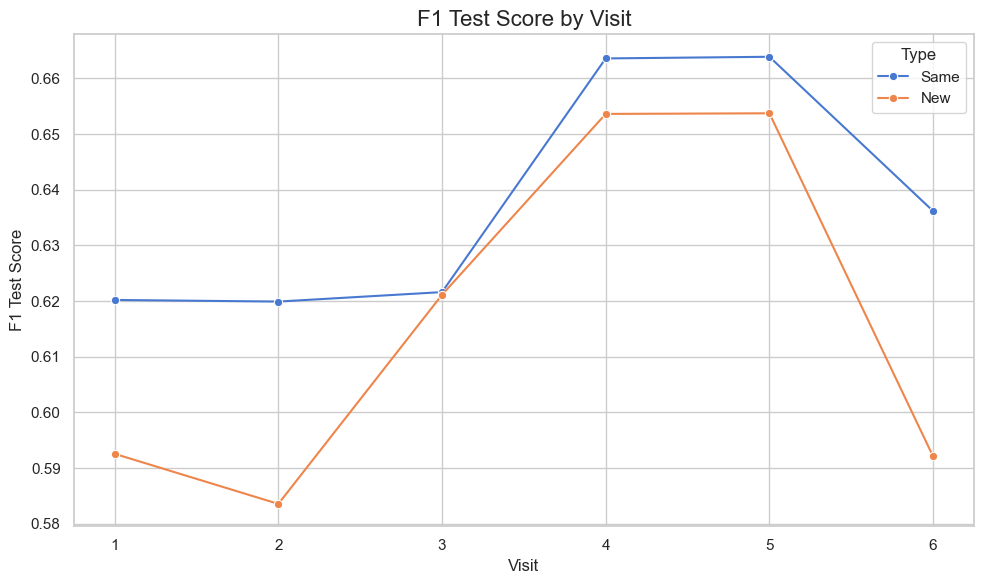

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

#make a simple plot for illustration

sns.set_theme(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.lineplot(data=f1_results_svm, x='Visit', y='F1_Test', hue='Type', marker='o', dashes=False, palette='muted')

plt.title('F1 Test Score by Visit', fontsize=16)
plt.xlabel('Visit', fontsize=12)
plt.ylabel('F1 Test Score', fontsize=12)

plt.legend(title='Type')

plt.tight_layout()  
plt.show()

## SVM
-	Preprocessing - done
-	Splitting - done
-	Scaling (on each, so it hasn’t learned anything about the test). done
-	(maybe feature reduction). But probably not… 
-	Hyperparameters optimize on the full dataset - done
-	Cross validation - done
-	Error analysis - mhh how??n

### Fit

In [40]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline

# Create a pipeline with MinMaxScaler and SVM
pipeline = make_pipeline(MinMaxScaler(), SVC())

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Evaluate on the test data
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy * 100:.2f}%")

# when not using the optimized hyperparameters I get an accuracy of 70 %. 

In [36]:
# try to fit it:
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline


pipeline = Pipeline([
        ('scaler', MinMaxScaler()), 
        ('svm', SVC(**params_SVM2)) # C=1.497565403390054, kernel='rbf', gamma='auto' : accuracy of 0.72
    ])
pipeline.fit(X_train, y_train)

prediction = pipeline.predict(X_test)

print(classification_report(y_test,prediction))
print(confusion_matrix(y_test, prediction))
print(accuracy_score(y_test, prediction))

# when using the optimized hyperparameters I get an accuracy of 0.72

              precision    recall  f1-score   support

         0.0       0.60      0.82      0.69      3815
         1.0       0.85      0.65      0.74      5864

    accuracy                           0.72      9679
   macro avg       0.72      0.73      0.71      9679
weighted avg       0.75      0.72      0.72      9679

[[3115  700]
 [2047 3817]]
0.7161896890174605


# XGBOOST
-	Preprocessing - done
-	Splitting - done
-	Scaling (on each, so it hasn’t learned anything about the test). - done
-	(maybe feature reduction). But probably not… 
-	Hyperparameters optimize on the full dataset - done
-	Cross validation - done
-	Error analysis


## Fit XGBoost

Try to fit the XGBooost, so we get all the scores from the report function used in the optimization

In [43]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import f1_score
import joblib
import os
from xgboost import XGBClassifier


def fit_and_evaluate_model(X_train, y_train, X_test, y_test, model):
    """
    Fit the XGBoost model on the training data and evaluate it on the test data.
    """
    scaler = MinMaxScaler()

    # Fit the scaler on the X_train_sample data
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test) # add to test

    model.fit(X_train, y_train);

    xgb_clf_tuned_2, xgb_report_tuned_2 = report(model, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)
    
    report_list = [xgb_report_tuned_2]
    clf_labels = ['XGBoost with 50 trials',]

    compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

    return compare_table


def train_and_evaluate(splits_same, splits_new, model):
    """
    Train and evaluate XGBoost models with specified hyperparameters on 12 datasets 
    (6 from each visit on same participants, 6 on new participants).
    """
    f1_results = []  # Store results for all datasets
    
    # Prepare datasets for same participants
    for i in range(1, 7):
        print(f"Training and evaluating on same participants from visit {i}")
        X_train = splits_same[f'visit_{i}']['X_train']
        y_train = splits_same[f'visit_{i}']['y_train']
        X_test = splits_same[f'visit_{i}']['X_test']
        y_test = splits_same[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train, y_train, X_test, y_test, model)
        # Add identifying columns (Dataset, Visit, Type)
        metrics['Dataset'] = f'Same_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "Same"
        f1_results.append(metrics)
    
    # Prepare datasets for new participants
    for i in range(1, 7):
        print(f"Training and evaluating on new participants from visit {i}")
        X_train = splits_new[f'visit_{i}']['X_train']
        y_train = splits_new[f'visit_{i}']['y_train']
        X_test = splits_new[f'visit_{i}']['X_test']
        y_test = splits_new[f'visit_{i}']['y_test']
        
        metrics = fit_and_evaluate_model(X_train, y_train, X_test, y_test, model)
        metrics['Dataset'] = f'New_Participants_{i}'
        metrics['Visit'] = i
        metrics['Type'] = "New"
        f1_results.append(metrics)
    
    # Convert results to DataFrame and save to CSV
    f1_df = pd.concat(f1_results, ignore_index=False)    
    f1_df.to_csv(os.path.join('..', 'out', 'f1_results_XGBoost2-new.csv'), index=False, mode='w', header=True)    

    return f1_df



Training and evaluating on same participants from visit 1
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 50398 samples
 Test Size: 89

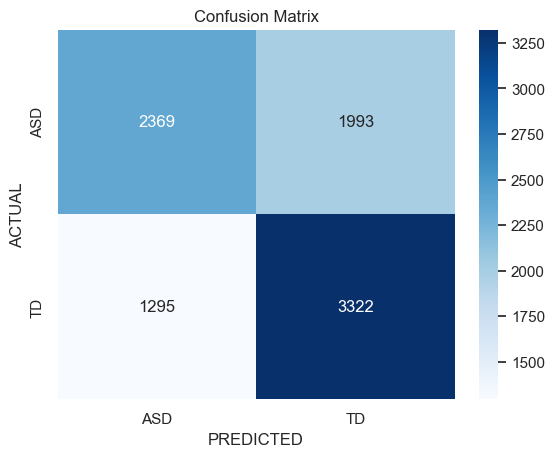


=======================================> PLOTS <=========================================


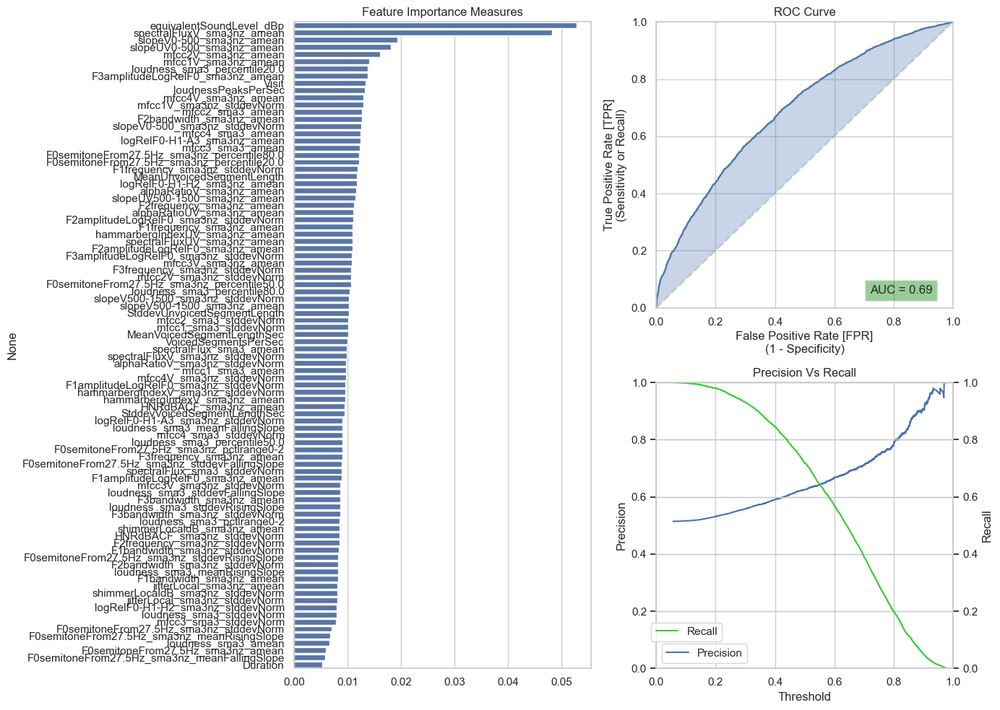

Training and evaluating on same participants from visit 2
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 48090 samples
 Test Size: 11

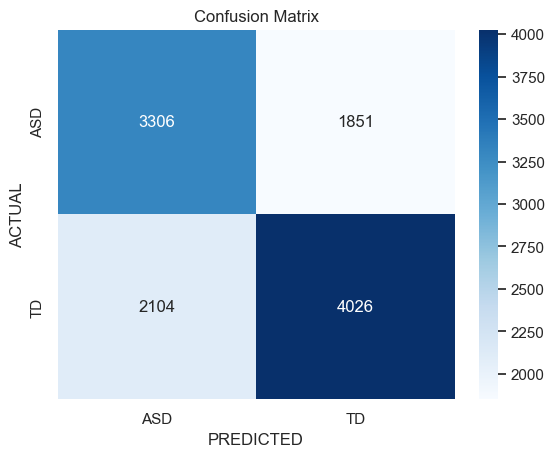


=======================================> PLOTS <=========================================


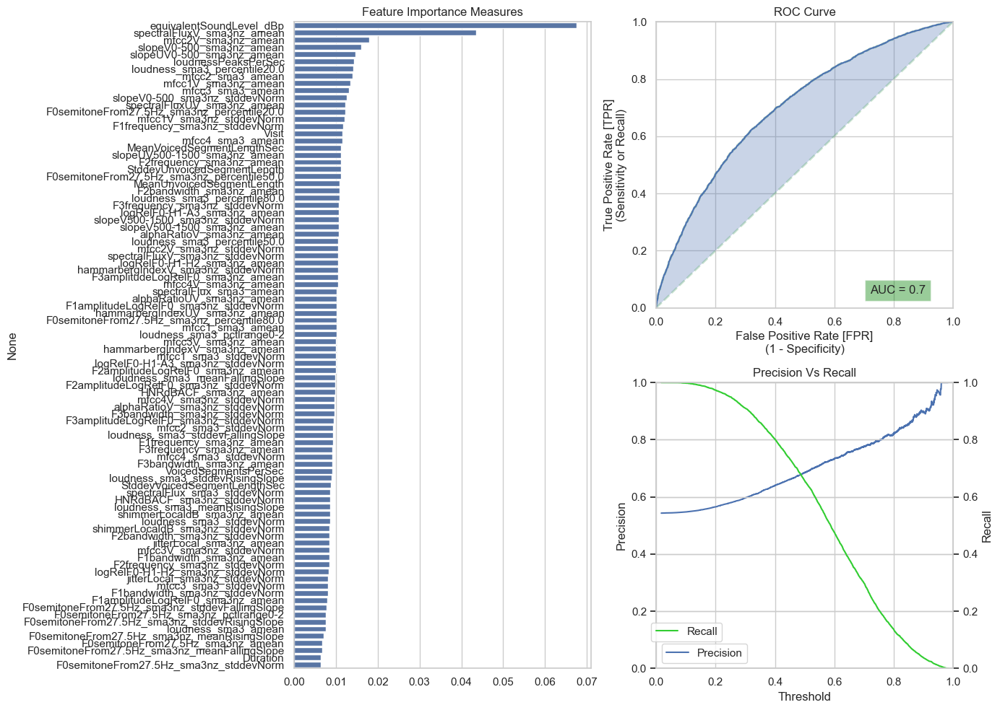

Training and evaluating on same participants from visit 3
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49596 samples
 Test Size: 97

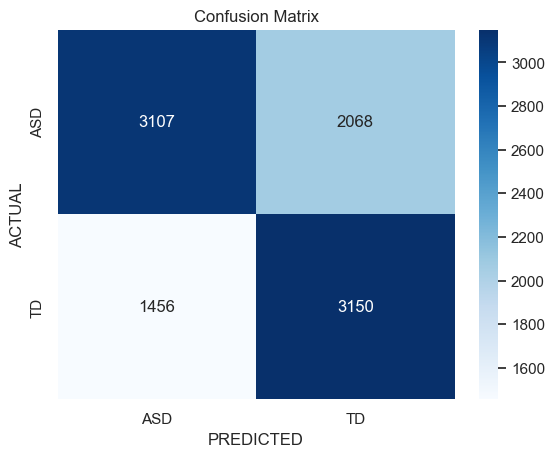


=======================================> PLOTS <=========================================


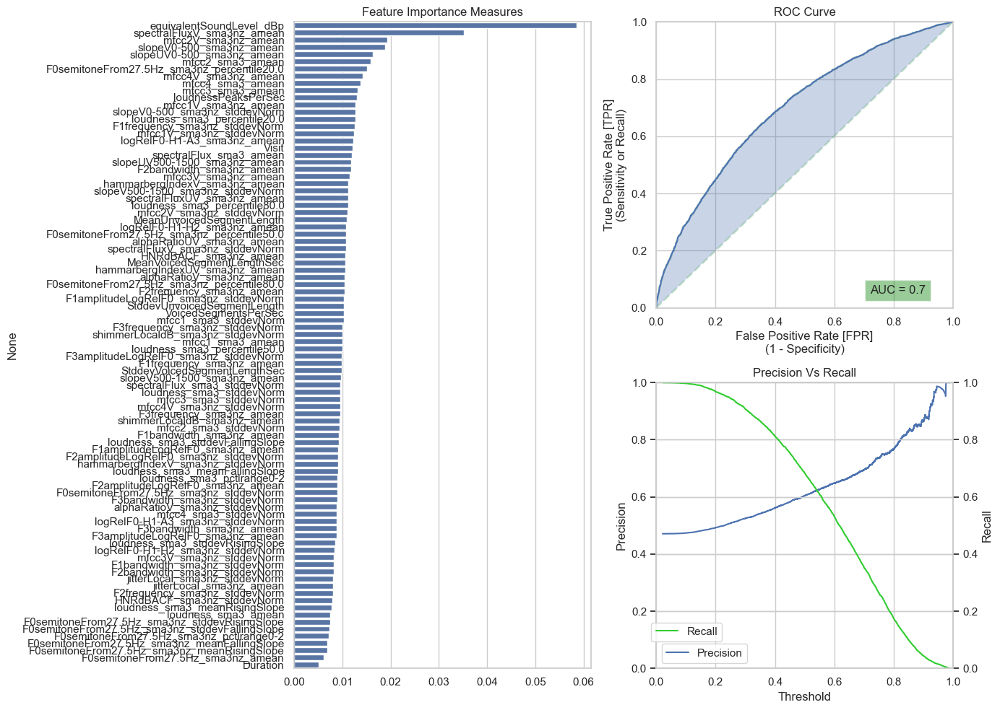

Training and evaluating on same participants from visit 4
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49522 samples
 Test Size: 98

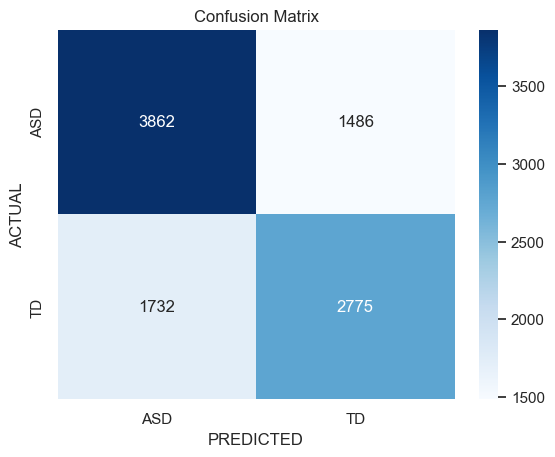


=======================================> PLOTS <=========================================


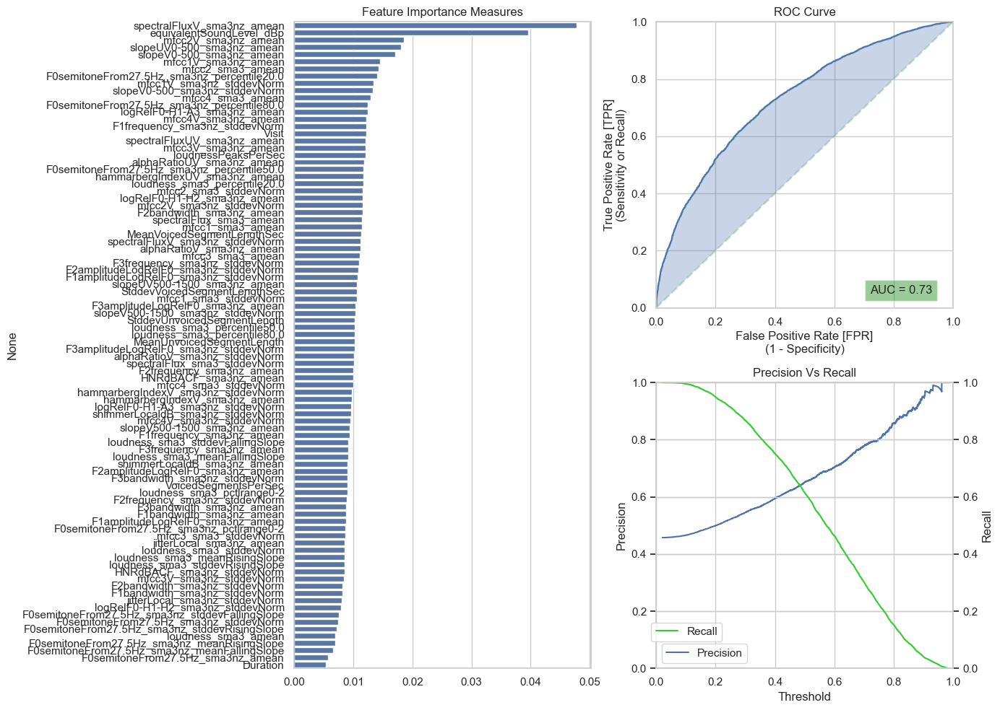

Training and evaluating on same participants from visit 5
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49366 samples
 Test Size: 10

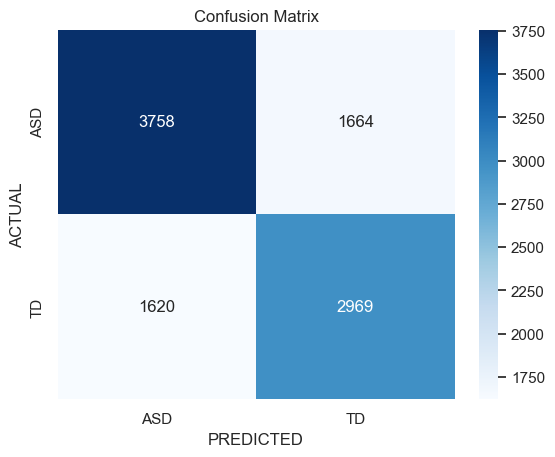


=======================================> PLOTS <=========================================


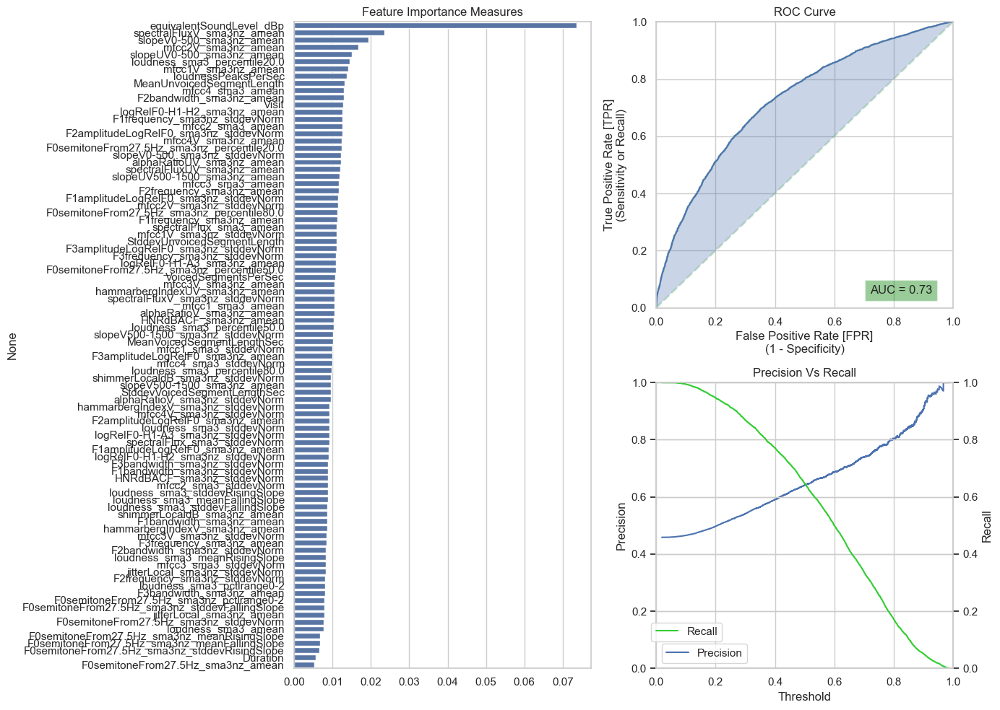

Training and evaluating on same participants from visit 6
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 49913 samples
 Test Size: 94

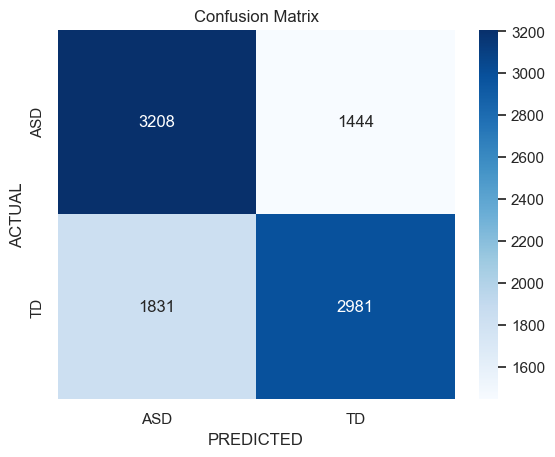


=======================================> PLOTS <=========================================


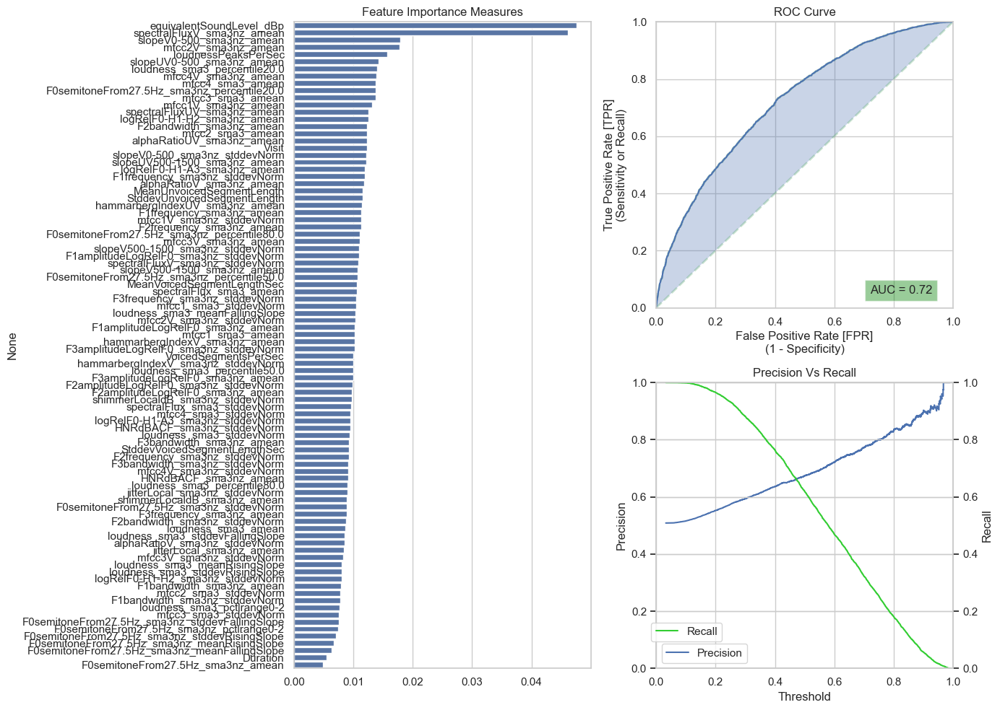

Training and evaluating on new participants from visit 1
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42619 samples
 Test Size: 136

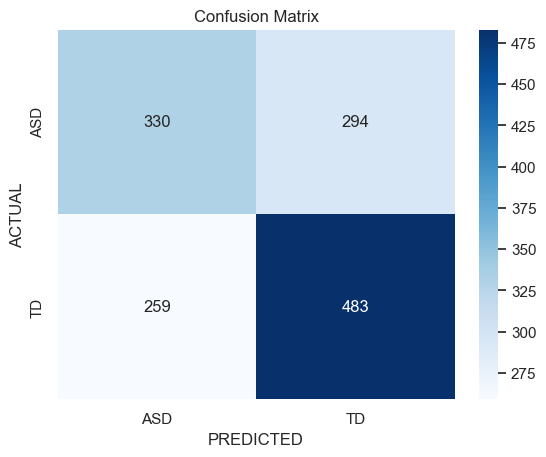


=======================================> PLOTS <=========================================


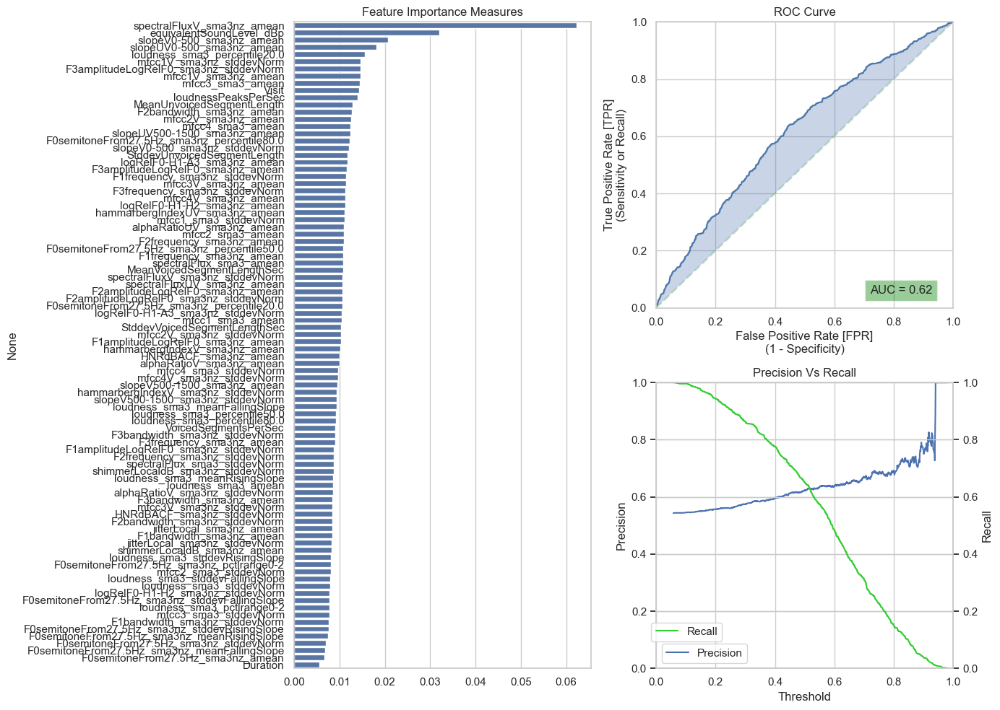

Training and evaluating on new participants from visit 2
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 40432 samples
 Test Size: 148

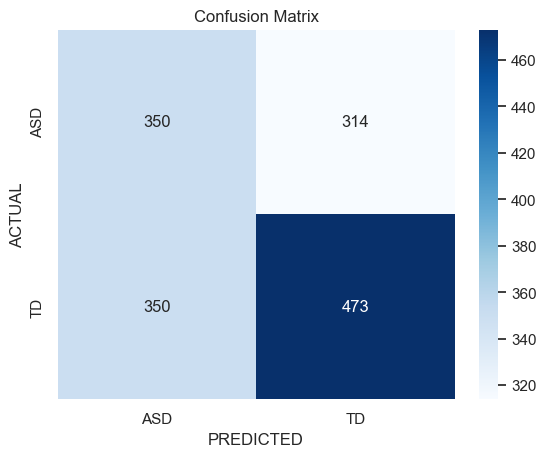


=======================================> PLOTS <=========================================


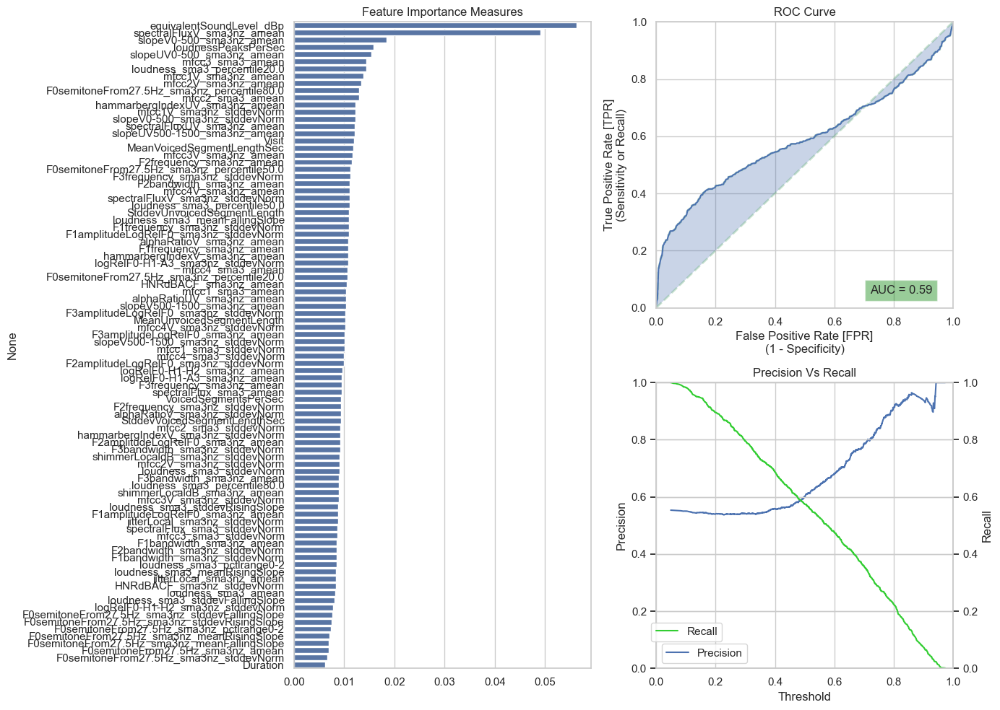

Training and evaluating on new participants from visit 3
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42005 samples
 Test Size: 155

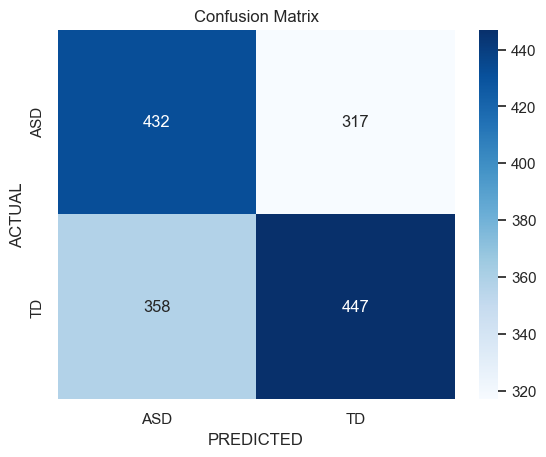


=======================================> PLOTS <=========================================


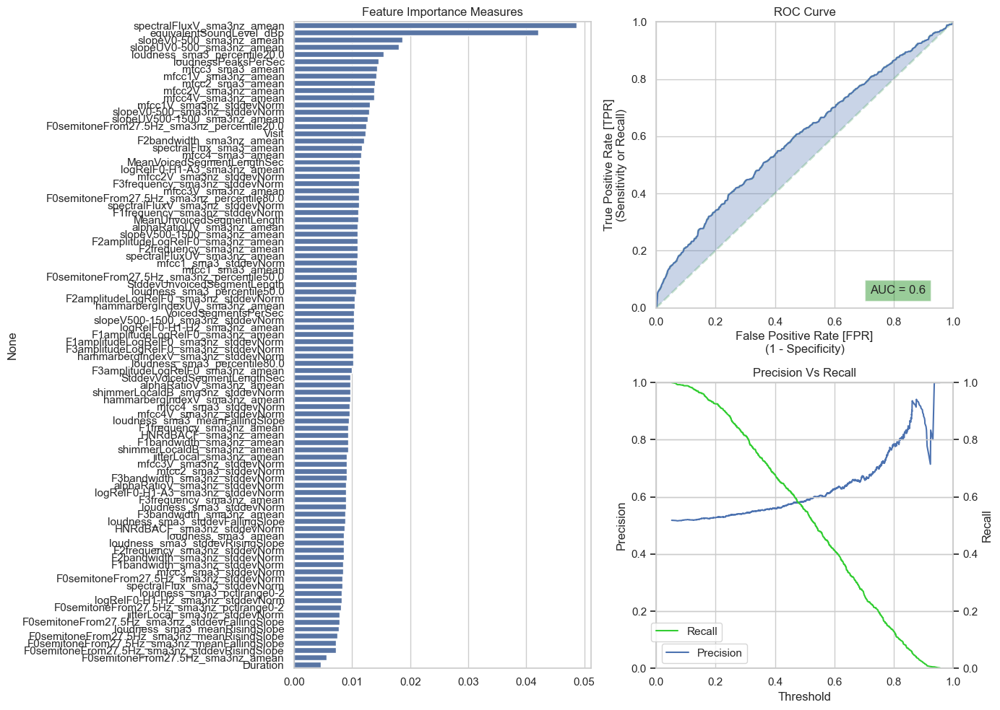

Training and evaluating on new participants from visit 4
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42089 samples
 Test Size: 171

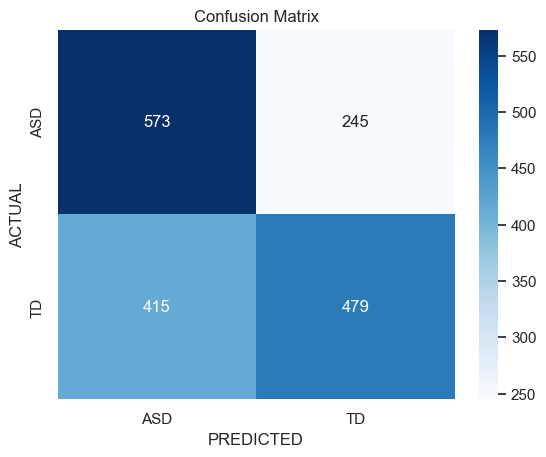


=======================================> PLOTS <=========================================


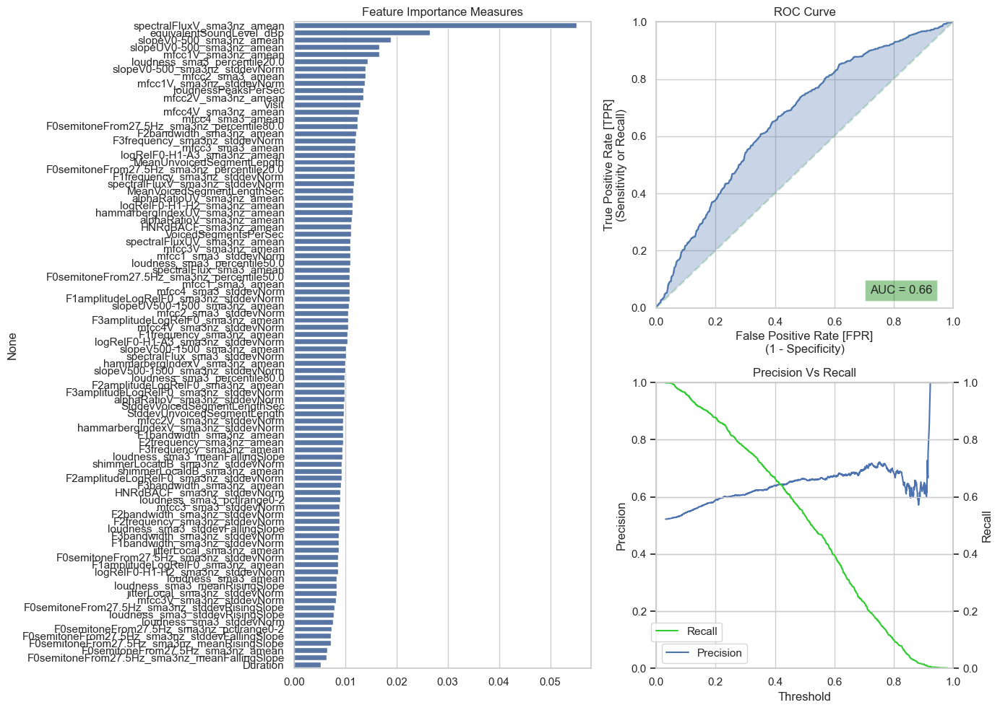

Training and evaluating on new participants from visit 5
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 41659 samples
 Test Size: 143

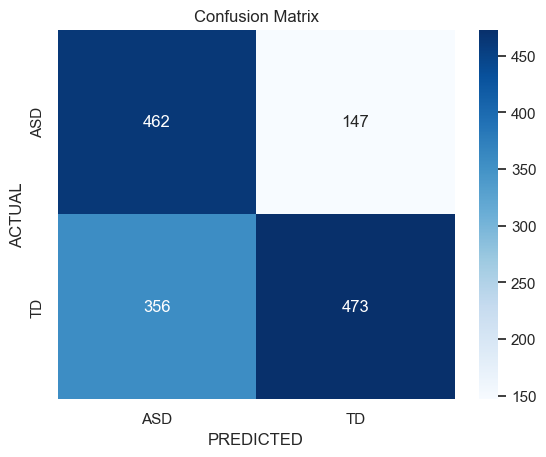


=======================================> PLOTS <=========================================


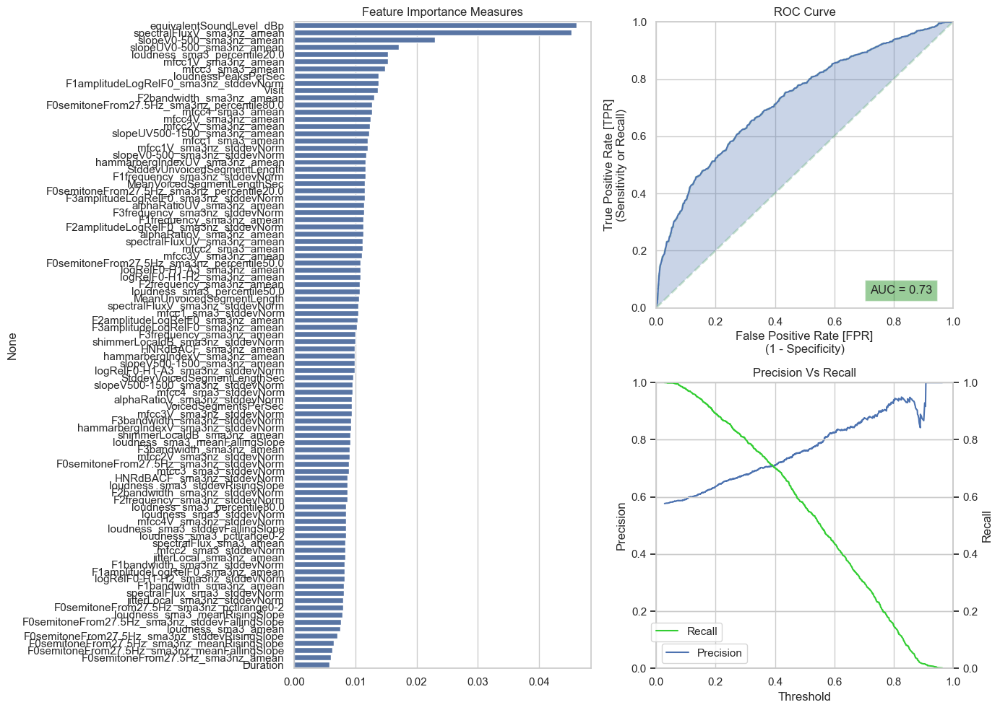

Training and evaluating on new participants from visit 6
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8639508711258084, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.09266307881793942,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1.6750810285737576e-10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=0, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 42356 samples
 Test Size: 158

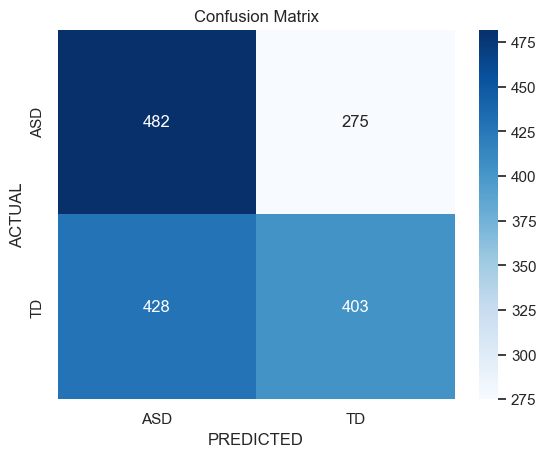


=======================================> PLOTS <=========================================


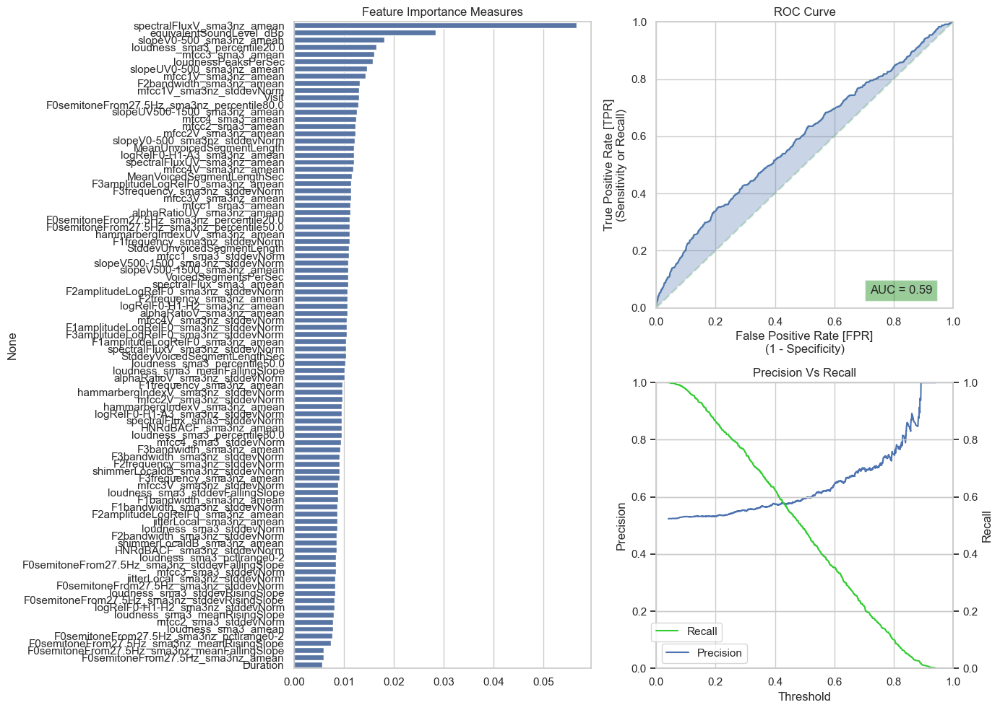

In [44]:
# Train and evaluate models using the best parameters
f1_df = train_and_evaluate(splits_same, splits_new, xgb_clf_tuned_2)

In [45]:
f1_df

,Train f1_score,Test f1_score,Overfitting,ROC Area,Precision,Recall,F1-score,Support,Dataset,Visit,Type
XGBoost with 50 trials,0.889,0.669,True,0.689519,0.625024,0.719515,0.668949,4617.0,Same_Participants_1,1,Same
XGBoost with 50 trials,0.895,0.671,True,0.701775,0.685043,0.65677,0.670609,6130.0,Same_Participants_2,2,Same
XGBoost with 50 trials,0.894,0.641,True,0.695687,0.60368,0.683891,0.641287,4606.0,Same_Participants_3,3,Same
XGBoost with 50 trials,0.895,0.633,True,0.729995,0.651256,0.615709,0.632984,4507.0,Same_Participants_4,4,Same
XGBoost with 50 trials,0.895,0.644,True,0.725618,0.640837,0.646982,0.643895,4589.0,Same_Participants_5,5,Same
XGBoost with 50 trials,0.886,0.645,True,0.722871,0.673672,0.619493,0.645448,4812.0,Same_Participants_6,6,Same
XGBoost with 50 trials,0.906,0.636,True,0.615719,0.621622,0.650943,0.635945,742.0,New_Participants_1,1,New
XGBoost with 50 trials,0.915,0.588,True,0.588292,0.601017,0.574727,0.587578,823.0,New_Participants_2,2,New
XGBoost with 50 trials,0.913,0.57,True,0.596368,0.585079,0.55528,0.56979,805.0,New_Participants_3,3,New
XGBoost with 50 trials,0.912,0.592,True,0.663081,0.661602,0.535794,0.592089,894.0,New_Participants_4,4,New


In [112]:
f1_df


Training and evaluating on same participants from visit 1


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6236010855872478
F1 score train: 0.7164222635075213
Training and evaluating on same participants from visit 2


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:15] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:18] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.639843476537734
F1 score train: 0.7067701582551136
Training and evaluating on same participants from visit 3


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:31] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6393397610811693
F1 score train: 0.7127125781573938
Training and evaluating on same participants from visit 4


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:47] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6719567337902227
F1 score train: 0.7118446539495656
Training and evaluating on same participants from visit 5


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:01:59] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6712580340789491
F1 score train: 0.7091115485779355
Training and evaluating on same participants from visit 6


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:14] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6529364896967947
F1 score train: 0.7110243753254673
Training and evaluating on new participants from visit 1


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6176165722519048
F1 score train: 0.7139764923914409
Training and evaluating on new participants from visit 2


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:38] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6378701637935532
F1 score train: 0.7016363516015819
Training and evaluating on new participants from visit 3


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:49] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:02:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.699638802655725
F1 score train: 0.7094961882859669
Training and evaluating on new participants from visit 4


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:06] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6994270726878846
F1 score train: 0.7068492608498639
Training and evaluating on new participants from visit 5


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:14] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:19] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.7255806512202961
F1 score train: 0.7080462831836327
Training and evaluating on new participants from visit 6


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:03:31] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "num_boost_round", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [

F1 score test: 0.6667515741774448
F1 score train: 0.7084225234619534


In [117]:
f1_results_xgb

,Dataset,Visit,Type,F1_CV_Train,F1_Test
0,Same_Participants_1,1,Same,0.716422,0.623601
1,Same_Participants_2,2,Same,0.706770,0.639843
2,Same_Participants_3,3,Same,0.712713,0.639340
3,Same_Participants_4,4,Same,0.711845,0.671957
4,Same_Participants_5,5,Same,0.709112,0.671258
5,Same_Participants_6,6,Same,0.711024,0.652936
6,New_Participants_1,1,New,0.713976,0.617617
7,New_Participants_2,2,New,0.701636,0.637870
8,New_Participants_3,3,New,0.709496,0.699639
9,New_Participants_4,4,New,0.706849,0.699427


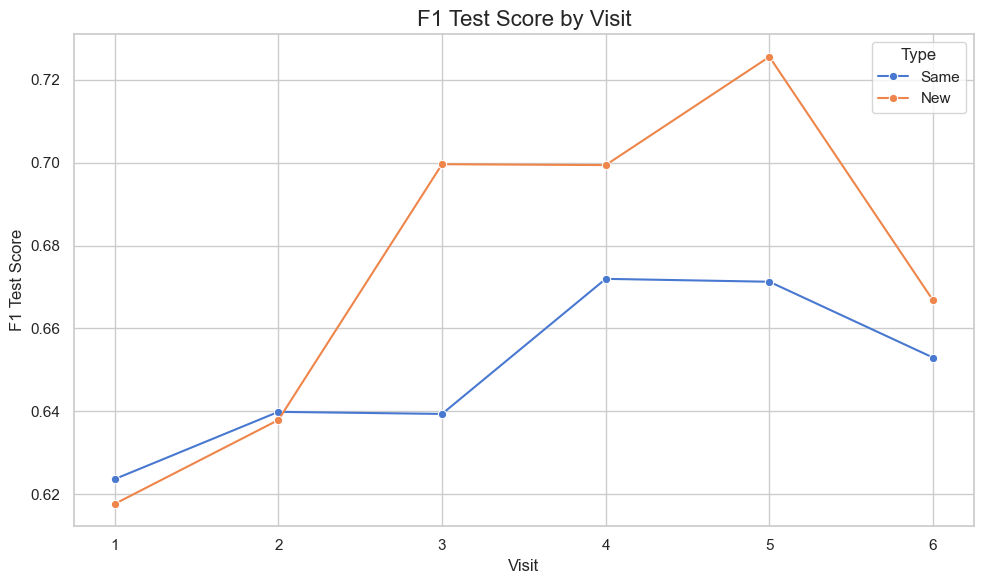